# Chest X-Rays Image Processing
Our aim in this project is to process chest X-Rays and explore the effects of different image processing techniques to highlight the presence of stents, if present. We would be exploring both classical deteministic image processing techniques as well as neural network based techniques.

First, we would be importing the modules needed: \
os is the module needed to access the files \
opencv(cv2) is used for image processing \
numpy is used for dealing with matrices \
scipy is used for statistical function \
random is used for selecting 5 pseudorandom images 

In [1]:
import os
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
from scipy import stats as st
import random

Now, we use the random module to randomly select the 5 images from the directory where they are stored

In [2]:
random.seed(42)
folder = 'X- Ray Image'
l = random.sample(os.listdir(folder), 10)
l

['1.2.826.0.1.3680043.8.498.10017127632518130787233241824845923514.jpg',
 '1.2.826.0.1.3680043.8.498.10002644592366004745415171692737199745.jpg',
 '1.2.826.0.1.3680043.8.498.10001065121843652267743449160233082683.jpg',
 '1.2.826.0.1.3680043.8.498.10009200682227193533239127301911164377.jpg',
 '1.2.826.0.1.3680043.8.498.10008193698745944671737283077530844393.jpg',
 '1.2.826.0.1.3680043.8.498.10007325230839039576266816449875945674.jpg',
 '1.2.826.0.1.3680043.8.498.10004680757941111877058507971361382698.jpg',
 '1.2.826.0.1.3680043.8.498.10002446304107330308555550280339793610.jpg',
 '1.2.826.0.1.3680043.8.498.10015156920643748692915108869712195069.jpg',
 '1.2.826.0.1.3680043.8.498.10002090428422465477470152567720822894.jpg']

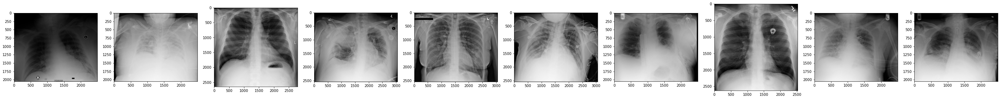

In [3]:
images = []
for i in l:
    images.append(cv.imread(folder+'/'+i, cv.IMREAD_UNCHANGED))
plt.figure(figsize=(50, 15))
for i, img in enumerate(images):
    plt.subplot(1, 10,i+1),plt.imshow(img, 'gray')
plt.show()

## Binarization
Let us try the first set of filters to see which of the image binarization techniques, if any work
- Binary Threshold
- OTSU Threshold
- Adaptive Threshold Mean
- Adaptive Threshold Gaussian

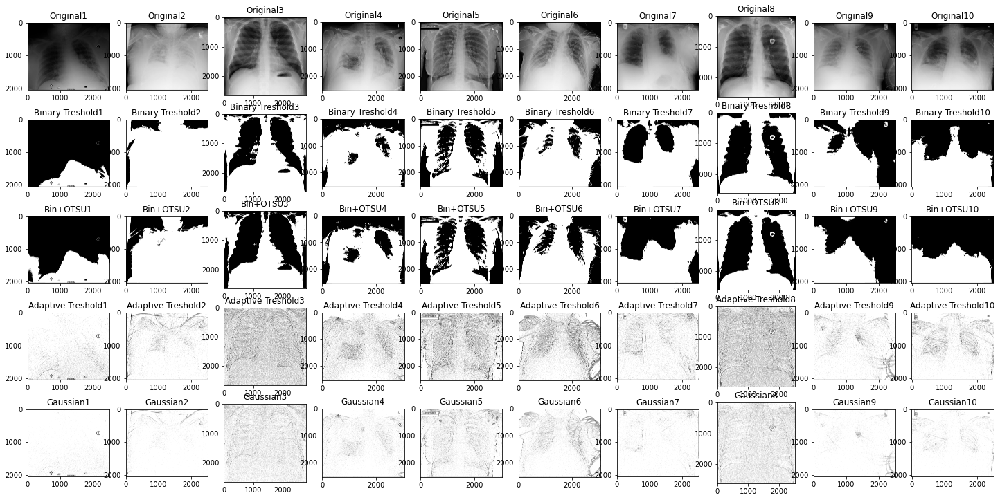

In [4]:
binimages = []
otsu = []
adaptivemean = []
adaptivegaussian = []
plt.figure(figsize=(25, 15))
nrows = 6
ncols = 10
for i, img in enumerate(images):
    c = 0
    plt.subplot(nrows, ncols, 10*c+i+1),plt.imshow(img, 'gray')
    c+=1
    plt.title('Original'+ str(i+1))
    
    ret,th = cv.threshold(img,100,255,cv.THRESH_BINARY)
    binimages.append(th)
    plt.subplot(nrows, ncols, 10*c + i+1),plt.imshow(th, 'gray')
    c+=1
    plt.title('Binary Treshold'+ str(i+1))
    
    ret,th = cv.threshold(img,80,255,cv.THRESH_BINARY+cv.THRESH_OTSU)
    otsu.append(th)
    plt.subplot(nrows, ncols, 10*c + i+1),plt.imshow(th, 'gray')
    c+=1
    plt.title('Bin+OTSU'+ str(i+1))
    
    th2 = cv.adaptiveThreshold(img,255,cv.ADAPTIVE_THRESH_MEAN_C,\
            cv.THRESH_BINARY,11,2)
    adaptivemean.append(th2)
    plt.subplot(nrows, ncols, 10*c + i+1),plt.imshow(th2, 'gray')
    c+=1
    plt.title('Adaptive Treshold'+ str(i+1))
    
    th3 = cv.adaptiveThreshold(img,255,cv.ADAPTIVE_THRESH_GAUSSIAN_C,\
            cv.THRESH_BINARY,11,2)
    adaptivegaussian.append(th3)
    plt.subplot(nrows, ncols, 10*c + i+1),plt.imshow(th3, 'gray')
    plt.title('Gaussian' + str(i+1))

The issue with binarization techniques was that it led to a lot of informatuon and thus was not effective..

Now let us try Canny Edge detection with different threshold values to see if the information about catheters is highlighted in any of them..

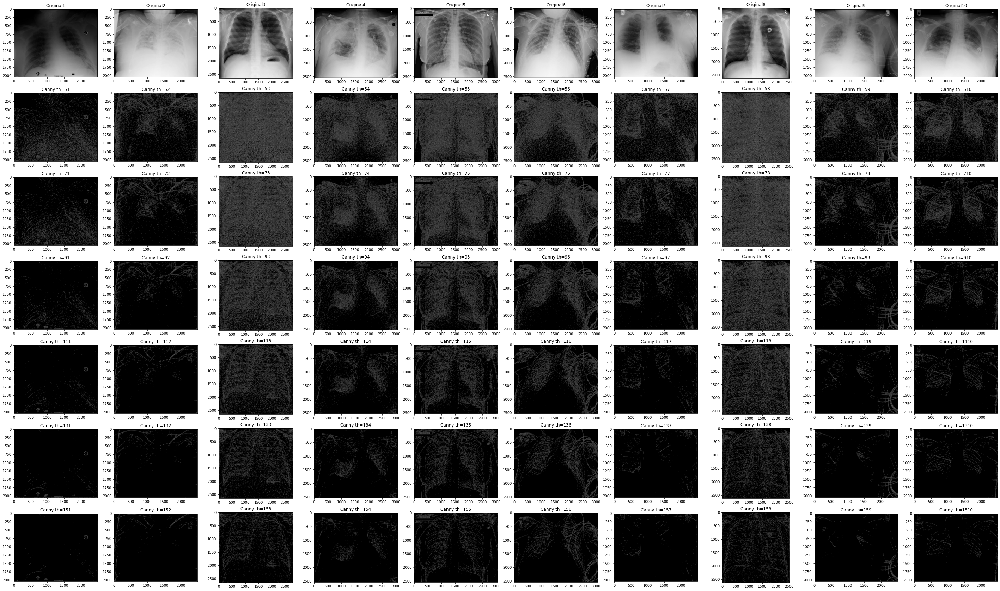

In [5]:
canny = []
nrows = 7
ncols = 10
plt.figure(figsize=(50, 30))
for i, img in enumerate(images):
    c = 0
    plt.subplot(nrows, ncols, 10*c+i+1),plt.imshow(img, 'gray')
    plt.title('Original'+ str(i+1))
    c += 1
    
    th1 = 5
    edges = cv.Canny(img,th1,2*th1)
    canny.append(edges)
    plt.subplot(nrows, ncols, 10*c+i+1),plt.imshow(edges, 'gray')
    plt.title('Canny th='+str(th1)+ str(i+1))
    c += 1
    
    th1 = 7
    edges = cv.Canny(img,th1,2*th1)
    canny.append(edges)
    plt.subplot(nrows, ncols, 10*c+i+1),plt.imshow(edges, 'gray')
    plt.title('Canny th='+str(th1)+ str(i+1))
    c += 1
    
    th1 = 9
    edges = cv.Canny(img,th1,2*th1)
    canny.append(edges)
    plt.subplot(nrows, ncols, 10*c+i+1),plt.imshow(edges, 'gray')
    plt.title('Canny th='+str(th1)+ str(i+1))
    c += 1
    
    th1 = 11
    edges = cv.Canny(img,th1,2*th1)
    canny.append(edges)
    plt.subplot(nrows, ncols, 10*c+i+1),plt.imshow(edges, 'gray')
    plt.title('Canny th='+str(th1)+ str(i+1))
    c += 1
    
    th1 = 13
    edges = cv.Canny(img,th1,2*th1)
    canny.append(edges)
    plt.subplot(nrows, ncols, 10*c+i+1),plt.imshow(edges, 'gray')
    plt.title('Canny th='+str(th1)+ str(i+1))
    c += 1
        
    th1 = 15
    edges = cv.Canny(img,th1,2*th1)
    canny.append(edges)
    plt.subplot(nrows, ncols, 10*c+i+1),plt.imshow(edges, 'gray')
    plt.title('Canny th='+str(th1)+ str(i+1))
    c += 1

Here, the issue is that different images require different parameter values..
We take one of the best performing values from the above tests ie 7, 15 and then apply Hugh Lines to highlight the edges.

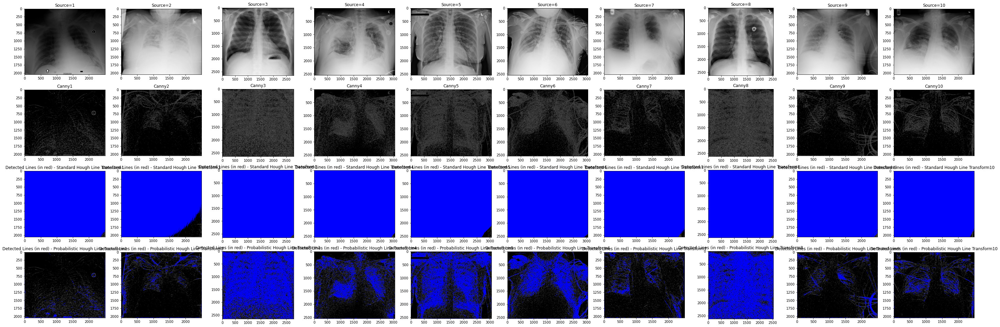

In [36]:
import math as math
plt.figure(figsize=(50, 30))
for i, src in enumerate(images):
    dst = cv.Canny(src, 7, 15, None, 3)
    
    # Copy edges to the images that will display the results in BGR
    cdst = cv.cvtColor(dst, cv.COLOR_GRAY2BGR)
    cdstP = np.copy(cdst)
    
    lines = cv.HoughLines(dst, 1, np.pi / 180, 50, None, 0, 0)
    
    if lines is not None:
        for j in range(0, len(lines)):
            rho = lines[j][0][0]
            theta = lines[j][0][1]
            a = math.cos(theta)
            b = math.sin(theta)
            x0 = a * rho
            y0 = b * rho
            pt1 = (int(x0 + 1000*(-b)), int(y0 + 1000*(a)))
            pt2 = (int(x0 - 1000*(-b)), int(y0 - 1000*(a)))
            cv.line(cdst, pt1, pt2, (0,0,255), 3, cv.LINE_AA)
    
    
    linesP = cv.HoughLinesP(dst, 1, np.pi / 180, 50, None, 50, 10)
    
    if linesP is not None:
        for j in range(0, len(linesP)):
            l = linesP[j][0]
            cv.line(cdstP, (l[0], l[1]), (l[2], l[3]), (0,0,255), 3, cv.LINE_AA)
    
    c = 0
    plt.subplot(nrows, ncols, 10*c+i+1),plt.imshow(src, 'gray')
    plt.title('Source='+ str(i+1))
    c += 1
    
    plt.subplot(nrows, ncols, 10*c+i+1),plt.imshow(dst, 'gray')
    plt.title("Canny"+ str(i+1))
    c += 1
    
    plt.subplot(nrows, ncols, 10*c+i+1),plt.imshow(cdst, 'gray')
    plt.title("Detected Lines (in red) - Standard Hough Line Transform"+ str(i+1))
    c += 1
    
    plt.subplot(nrows, ncols, 10*c+i+1),plt.imshow(cdstP, 'gray')
    plt.title("Detected Lines (in red) - Probabilistic Hough Line Transform"+ str(i+1))
    c += 1
    

On Highlighting we notice that while the probabilistic hugh lines is somewhat effective, the standard hugh lines is not(maybe because of incorrect parametrisation or the tendency to draw complete lines instead of curves)

Now in addition to these, we try out the histogram equalization technique as suggested in this [paper](https://ieeexplore.ieee.org/abstract/document/8325607).

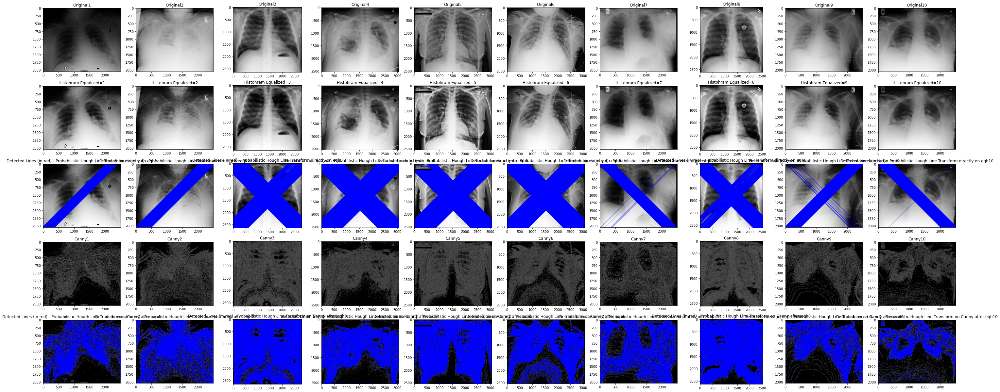

In [42]:
eh = []
nrows = 7
ncols = 10
plt.figure(figsize=(50, 30))
for i, img in enumerate(images):
    if(True):
        c = 0
        plt.subplot(nrows, ncols, 10*c+i+1),plt.imshow(img, 'gray')
        plt.title('Original'+ str(i+1))
        c += 1

        eqh = cv.equalizeHist(img)
        eh.append(eqh)
        plt.subplot(nrows, ncols, 10*c+i+1),plt.imshow(eqh, 'gray')
        plt.title('Histohram Equalized='+ str(i+1))
        c += 1

        cdst = cv.cvtColor(eqh, cv.COLOR_GRAY2BGR)

        linesP = cv.HoughLinesP(eqh, 1, np.pi / 180, 4000, None, 50, 10)

        if linesP is not None:
            for j in range(0, len(linesP)):
                l = linesP[j][0]
                cv.line(cdst, (l[0], l[1]), (l[2], l[3]), (0,0,255), 3, cv.LINE_AA)


        dst = cv.Canny(eqh, 7, 15, None, 3)

        # Copy edges to the images that will display the results in BGR
        cdstP = cv.cvtColor(dst, cv.COLOR_GRAY2BGR)

        linesP = cv.HoughLinesP(dst, 1, np.pi / 180, 300, None, 50, 10)

        if linesP is not None:
            for j in range(0, len(linesP)):
                l = linesP[j][0]
                cv.line(cdstP, (l[0], l[1]), (l[2], l[3]), (0,0,255), 3, cv.LINE_AA)

        plt.subplot(nrows, ncols, 10*c+i+1),plt.imshow(cdst, 'gray')
        plt.title("Detected Lines (in red) - Probabilistic Hough Line Transform directly on eqh"+ str(i+1))
        c += 1

        plt.subplot(nrows, ncols, 10*c+i+1),plt.imshow(dst, 'gray')
        plt.title("Canny"+ str(i+1))
        c += 1

        plt.subplot(nrows, ncols, 10*c+i+1),plt.imshow(cdstP, 'gray')
        plt.title("Detected Lines (in red) - Probabilistic Hough Line Transform on Canny after eqh"+ str(i+1))
        c += 1


Here, we can visibly see that the Histogram Equalization method visibly increases the sharpness of the image.

So, it can be hypothesized that applying the canny+probabilistic hough line on the histogram equalized image would improve the result.
With this in mind, we plotted the results of directly drawing Hough Lines on the equalized image and drawing Hough lines on this equalized image after applying the Canny Edge detector with the threshold values(7,15).

The difference was apparant and direct application led to incorrect diagonal lines while doing it after canny gave okish results.

Thus we can conclude that the filter that always imporves the image is the histogram equaliser while Canny gives good results when used with the proper thresholds which might be hard to determine.

In order to solve this issue we can probably provide the user with multiple outputs using different canny thresholds and allow them to select the best

# Deep Learning Based Approach
This problem seems to be a direct application of semantic segmentation. 

A Deep Learning Based approach would be able to learn what do the chest bones, cartillage and muscles look like under X-rays and thus be able to segment the pixels of the image into either skin, bone or Tubes.

It is similar to the problem of extracting road maps from satellite images and thus I feel a U-Net type architecture would give good results as a number of SOTA papers have used this architecture.